In [1]:
import cv2
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import pickle
import seaborn as sns

from sklearn.decomposition import PCA
from tensorflow import keras
from tensorflow.keras.applications.resnet50 import ResNet50, preprocess_input
from tensorflow.keras.layers import GlobalMaxPooling2D
from tensorflow.keras.preprocessing import image
from tqdm.auto import tqdm

In [2]:
DATASET_PATH = "/Users/jeremy/Google Drive/datasets/fashion-dataset/"

In [3]:
df = pd.read_csv(DATASET_PATH + "styles_preprocessed.csv", error_bad_lines=False)
df['image'] = df.apply(lambda row: str(row['id']) + ".jpg", axis=1)
df = df.reset_index(drop=True)
df

,id,gender,masterCategory,subCategory,articleType,baseColour,season,year,usage,productDisplayName,image
0,15970,Men,Apparel,Topwear,Shirts,Navy Blue,Fall,2011,Casual,Turtle Check Men Navy Blue Shirt,15970.jpg
1,39386,Men,Apparel,Bottomwear,Jeans,Blue,Summer,2012,Casual,Peter England Men Party Blue Jeans,39386.jpg
2,59263,Women,Accessories,Watches,Watches,Silver,Winter,2016,Casual,Titan Women Silver Watch,59263.jpg
3,21379,Men,Apparel,Bottomwear,Track Pants,Black,Fall,2011,Casual,Manchester United Men Solid Black Track Pants,21379.jpg
4,53759,Men,Apparel,Topwear,Tshirts,Grey,Summer,2012,Casual,Puma Men Grey T-shirt,53759.jpg
...,...,...,...,...,...,...,...,...,...,...,...
44434,17036,Men,Footwear,Shoes,Casual Shoes,White,Summer,2013,Casual,Gas Men Caddy Casual Shoe,17036.jpg
44435,6461,Men,Footwear,Flip Flops,Flip Flops,Red,Summer,2011,Casual,Lotto Men's Soccer Track Flip Flop,6461.jpg
44436,18842,Men,Apparel,Topwear,Tshirts,Blue,Fall,2011,Casual,Puma Men Graphic Stellar Blue Tshirt,18842.jpg
44437,46694,Women,Personal Care,Fragrance,Perfume and Body Mist,Blue,Spring,2017,Casual,Rasasi Women Blue Lady Perfume,46694.jpg


In [10]:
# Load ResNet-50 model pretrained on Imagenet without the classifying layers on top.
base_model = ResNet50(weights='imagenet', include_top=False, input_shape=(224, 224, 3))
model = keras.Sequential([
    base_model,
    GlobalMaxPooling2D()
])
model.summary()

Model: "sequential_1"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
resnet50 (Functional)        (None, 7, 7, 2048)        23587712  
_________________________________________________________________
global_max_pooling2d_1 (Glob (None, 2048)              0         
Total params: 23,587,712
Trainable params: 23,534,592
Non-trainable params: 53,120
_________________________________________________________________


In [4]:
def get_img_path(img):
  return DATASET_PATH + "images/" + img

In [12]:
def extract_embeddings(img_name, model):
  input_shape = (224, 224, 3)
  img = image.load_img(get_img_path(img_name), target_size=(input_shape[0], input_shape[1]))
  img_array = image.img_to_array(img)
  expanded_img_array = np.expand_dims(img_array, axis=0)
  preprocessed_img = preprocess_input(expanded_img_array)
  embeddings = model.predict(preprocessed_img)
  return embeddings.reshape(-1)

In [19]:
# Create embeddings and store them into dataframe
tqdm.pandas()
map_embeddings = df['image'].progress_map(lambda img: extract_embeddings(img, model))
df_embs        = map_embeddings.apply(pd.Series)

100%|██████████| 44439/44439 [2:18:02<00:00,  5.37it/s]


In [21]:
df_embs.to_pickle(DATASET_PATH + "resnet50-embeddings-full.pkl")

In [5]:
df_embs = pickle.load(open(DATASET_PATH + "resnet50-embeddings-full.pkl", "rb"))

In [6]:
# Filter only embeddings with master category 'Apparel' and save indices to filter for them later
df_filtered = df.loc[df.masterCategory == 'Apparel']
df_filtered_idx = df_filtered.index.values.tolist()
df_filtered = df_filtered.reset_index(drop=True)
df_filtered.masterCategory.unique(), df_filtered.shape, len(df_filtered_idx)

(array(['Apparel'], dtype=object), (21393, 11), 21393)

In [7]:
embs_filtered = []
for i, row in df_embs.iterrows():
    if i in  df_filtered_idx:
        embs_filtered.append(row)
df_embs_filtered = pd.DataFrame(embs_filtered)
df_embs_filtered = df_embs_filtered.reset_index(drop=True)
df_embs_filtered

,0,1,2,3,4,5,6,7,8,9,...,2038,2039,2040,2041,2042,2043,2044,2045,2046,2047
0,5.661311,2.366158,0.000000,3.255738,0.845207,2.673839,8.780884,6.280785,0.787186,1.587661,...,2.463607,0.000000,1.825991,20.485271,3.902871,0.000000,8.225970,1.313863,0.000000,10.820534
1,5.790412,9.593652,0.000000,9.431687,0.287238,0.259950,17.028755,3.037456,0.136339,0.000000,...,1.670569,0.013894,10.338679,4.784732,0.189142,0.000000,7.739138,0.372693,0.000000,8.903797
2,5.882204,1.958622,0.000000,12.519884,0.000000,0.000000,9.383584,3.781623,0.000000,1.490620,...,17.825481,0.000000,3.592513,2.042306,0.000000,0.000000,6.656784,1.457313,1.694215,1.403330
3,0.245961,17.383436,0.493822,3.374461,2.567365,0.000000,6.482548,5.862635,0.000000,3.164864,...,4.464021,0.447082,1.448132,12.884141,0.000000,0.397487,5.028076,1.939697,0.000000,11.485396
4,0.028540,18.567101,0.000000,0.757250,1.504954,0.000000,1.982043,2.963786,1.072763,4.539298,...,3.247076,4.273134,3.088639,16.997049,0.000000,0.000000,2.258092,1.595798,0.000000,7.674057
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
21388,0.000000,35.020271,7.460171,1.012842,1.366380,2.258118,1.922700,1.341036,1.293422,0.000000,...,4.813864,2.418916,1.957278,0.703634,6.915268,0.523176,4.877475,0.000000,0.000000,14.361758
21389,2.841607,15.895623,1.662815,2.716725,0.000000,0.727688,1.496747,0.472215,0.905088,3.890155,...,6.330880,2.010111,3.669139,13.017206,0.000000,0.749803,4.271129,1.611024,0.000000,9.624297
21390,3.243481,16.985628,1.560327,2.596826,0.545848,0.000000,9.023268,0.919529,1.380090,3.811848,...,13.571547,2.010174,1.121704,18.124388,1.862831,0.000000,1.212624,2.394026,3.093368,25.842484
21391,3.075987,6.170718,0.000000,0.242754,6.728174,0.000000,3.616792,1.160508,0.088385,1.244293,...,4.731680,1.630670,0.743359,15.961621,9.004664,0.551970,1.509514,0.000000,1.935909,13.389180


In [8]:
num_feature_dimensions = 2  # Set the number of embedding dimensions
pca = PCA(n_components = num_feature_dimensions)
embs_compressed = pca.fit_transform(df_embs_filtered)
df_embs_compressed = pd.DataFrame(embs_compressed)
df_embs_compressed

,0,1
0,-64.357361,2.009751
1,-52.113625,-68.620995
2,-22.425570,-59.430878
3,-54.588444,-30.280840
4,-28.993324,-14.922006
...,...,...
21388,106.352821,-50.901775
21389,-37.274281,-15.107389
21390,-33.474812,26.566368
21391,1.716130,63.075279


In [10]:
df_filtered['x'] = df_embs_compressed[0]
df_filtered['y'] = df_embs_compressed[1]
#df['z'] = df_embs_compressed[2]

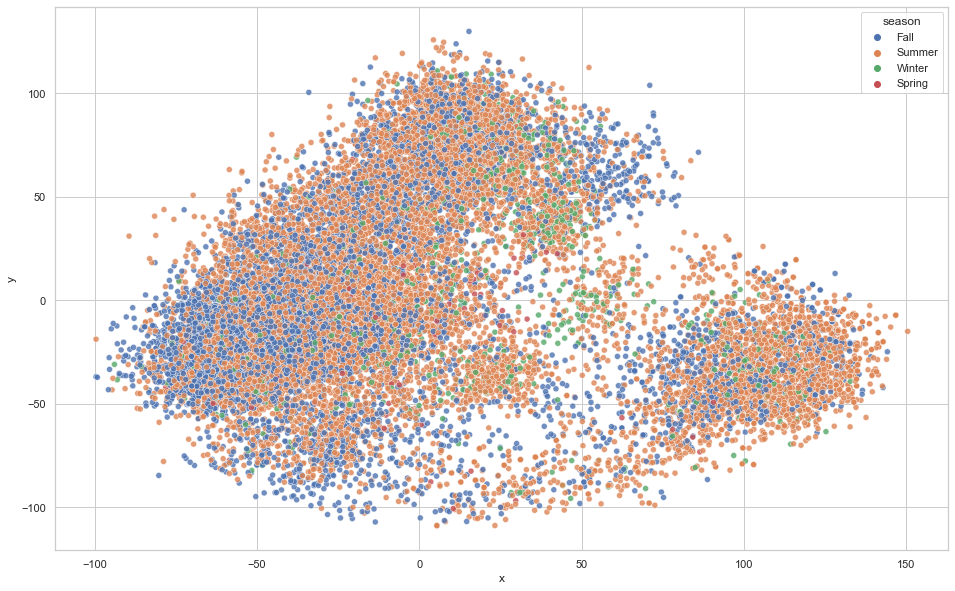

In [14]:
sns.set_theme(style="whitegrid")

fig, ax = plt.subplots(figsize=(16, 10))
sns.scatterplot(x="x", y="y", 
                hue="season", 
                data=df_filtered, 
                legend="full",
                alpha=0.8)
plt.savefig("pca-2d-apparel-season")

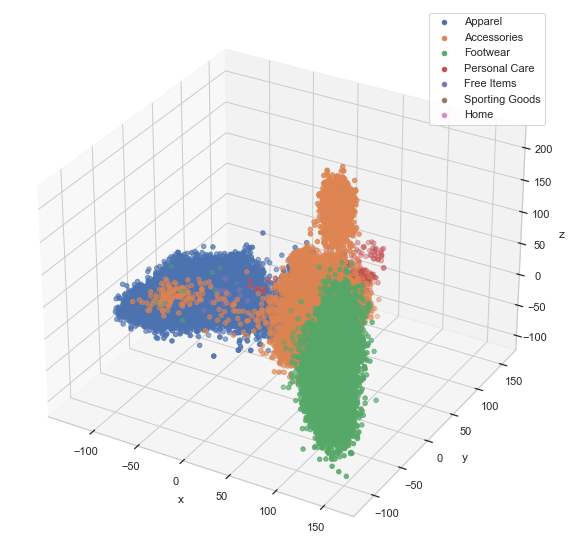

In [9]:
sns.set_theme(style="whitegrid")

fig = plt.figure(figsize=(16, 10))
ax = fig.add_subplot(111, projection = '3d')

ax.set_xlabel("x")
ax.set_ylabel("y")
ax.set_zlabel("z")

for s in df.masterCategory.unique():
    ax.scatter(df.x[df.masterCategory == s], df.y[df.masterCategory == s], df.z[df.masterCategory == s], label=s)
ax.legend()

plt.savefig("pca-3d-category")